<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_in_the_works/blob/main/IV_wheat_kaggle_labels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-09-07 18:43:36--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1244 (1.2K) [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]   1.21K  --.-KB/s    in 0s      

2021-09-07 18:43:36 (37.1 MB/s) - ‘install_colab.sh’ saved [1244/1244]

Installing icevision + dependencices for CUDA 10
Uninstalling some dependencies to prevent errors
Found existing installation: torchvision 0.10.0+cu102
Uninstalling torchvision-0.10.0+cu102:
  Successfully uninstalled torchvision-0.10.0+cu102
Found existing installation: fastai 1.0.61
Uninstalling fastai-1.0.61:
  Successfully uninstalled fastai-1.0.61
Installing some dependencies to prevent errors
     |██

In [1]:
from icevision.all import *

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:69
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

In [2]:
import icevision
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.8.1
torch v 1.8.0+cu101
torchvision v 0.9.0+cu101


In [6]:
# trying direct download

#!pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"marialrodriguez","key":"e3f17a764b333ed8cc29ecaf8d2b6b4e"}'}

In [9]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [10]:
!chmod 600 ~/.kaggle/kaggle.json

In [11]:
# https://www.kaggle.com/c/global-wheat-detection/overview

! pip install --upgrade --force-reinstall --no-deps kaggle
! mkdir -p ~/.kaggle/
! cp /kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download -c global-wheat-detection
! unzip /content/global-wheat-detection.zip -d /content/global-wheat-detection > /dev/null


  Using cached kaggle-1.5.12-py3-none-any.whl
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12
cp: cannot stat '/kaggle.json': No such file or directory
 98% 593M/607M [00:04<00:00, 132MB/s]
100% 607M/607M [00:05<00:00, 126MB/s]


In [12]:
!ls

'=5.1'			  global-wheat-detection.zip   kaggle.json
 global-wheat-detection   install_colab.sh	       sample_data


In [13]:
Path('./global-wheat-detection').ls()
# already unzipped

(#4) [Path('global-wheat-detection/sample_submission.csv'),Path('global-wheat-detection/train'),Path('global-wheat-detection/train.csv'),Path('global-wheat-detection/test')]

In [14]:
%cd global-wheat-detection
!ls  # pwd, folders

/content/global-wheat-detection
sample_submission.csv  test  train  train.csv


In [15]:
import pandas as pd
df = pd.read_csv('train.csv')
df.tail(3)
# bbox - a bounding box, formatted as a Python-style list of [xmin, ymin, width, height]


,image_id,width,height,bbox,source
147790,5e0747034,1024,1024,"[134.0, 228.0, 141.0, 71.0]",arvalis_2
147791,5e0747034,1024,1024,"[430.0, 13.0, 184.0, 79.0]",arvalis_2
147792,5e0747034,1024,1024,"[875.0, 740.0, 94.0, 61.0]",arvalis_2


In [16]:
df.info()
# 147,793 entries, no missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   image_id  147793 non-null  object
 1   width     147793 non-null  int64 
 2   height    147793 non-null  int64 
 3   bbox      147793 non-null  object
 4   source    147793 non-null  object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


In [ ]:
df.image_id.nunique()
# 3,373 images

3373

In [ ]:
df.source.unique().tolist()

['usask_1',
 'arvalis_1',
 'inrae_1',
 'ethz_1',
 'arvalis_3',
 'rres_1',
 'arvalis_2']

In [ ]:
!ls

sample_submission.csv  test  train  train.csv


In [ ]:
Path('train').ls()
# 3,422 images

(#3422) [Path('train/a666d9bcd.jpg'),Path('train/94f80c57a.jpg'),Path('train/844d5bd76.jpg'),Path('train/40ca794c1.jpg'),Path('train/b4dced91c.jpg'),Path('train/b838eaf1d.jpg'),Path('train/947117f47.jpg'),Path('train/3d5f3124e.jpg'),Path('train/aa82bfd6a.jpg'),Path('train/c7637f1dd.jpg')...]

In [ ]:
Path('./').ls()

(#4) [Path('train'),Path('test'),Path('sample_submission.csv'),Path('train.csv')]

In [17]:
data_dir = Path('/content/global-wheat-detection')
images_dir = data_dir/'train'
annotations_dir = data_dir/'train.csv'
template_record = ObjectDetectionRecord()

In [ ]:
images_dir.ls()

(#3422) [Path('/content/global-wheat-detection/train/a666d9bcd.jpg'),Path('/content/global-wheat-detection/train/94f80c57a.jpg'),Path('/content/global-wheat-detection/train/844d5bd76.jpg'),Path('/content/global-wheat-detection/train/40ca794c1.jpg'),Path('/content/global-wheat-detection/train/b4dced91c.jpg'),Path('/content/global-wheat-detection/train/b838eaf1d.jpg'),Path('/content/global-wheat-detection/train/947117f47.jpg'),Path('/content/global-wheat-detection/train/3d5f3124e.jpg'),Path('/content/global-wheat-detection/train/aa82bfd6a.jpg'),Path('/content/global-wheat-detection/train/c7637f1dd.jpg')...]

In [20]:
# using plant parser 3rd try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        #self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    #def labels(self, o) -> int:
     # return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            #record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels([1])#

# AttributeError: 'NoneType' object has no attribute 'get_by_name'

In [22]:
_classes = df['source'].unique().tolist()
class_map = ClassMap(_classes)
class_map.get_by_name('arvalis_2')

7

In [23]:
# using plant parser 4th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    #def labels(self, o) -> int:
     # return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels([1])#

# KeyError: 1

In [25]:
# using plant parser 5th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    #def labels(self, o) -> int:
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels(1)#

# TypeError: 'int' object is not iterable

In [27]:
# using plant parser 6th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> int:
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels(labels)#

# NameError: name 'labels' is not defined

In [29]:
# using plant parser 7th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> int:
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels([labels])#

# NameError: name 'labels' is not defined

In [31]:
# using plant parser 8th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> int:
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels([self.labels])#

# KeyError: <bound method PlantDocParser.labels of <__main__.PlantDocParser object at 0x7f3c8fe4ba10>>

In [33]:
# using plant parser 9th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> int:
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels(self.labels)#

# TypeError: 'method' object is not iterable

In [38]:
# using plant parser 10th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> int:
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels('1')#

# KeyError: '1'

In [43]:
# using plant parser 11th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> List[int]: #
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels(labels)#

# NameError: name 'labels' is not defined

In [45]:
# using plant parser 12th try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def labels(self, o) -> List[int]: #
        return [1]

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels(self.labels)#

# TypeError: 'method' object is not iterable

In [46]:
parser = PlantDocParser(template_record, data_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/147793 [00:00<?, ?it/s]

TypeError: ignored

In [ ]:
# using plant parser 2nd try
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = df
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.image_id #

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'train' / f'{o.image_id}.jpg' #
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xywh(*np.fromstring(o.bbox[1:-1], sep=","))])
        record.detection.add_labels([o.source])#

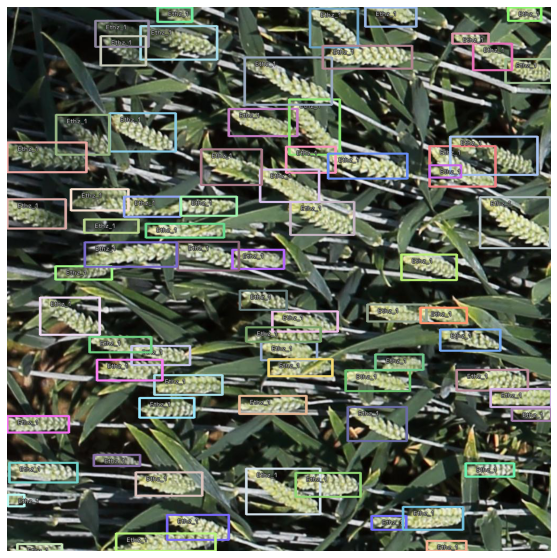

In [ ]:
show_record(train_records[4], #class_map=class_map, 
            figsize = (10,10) )#,font_size=20, label_color = '#ffff00')

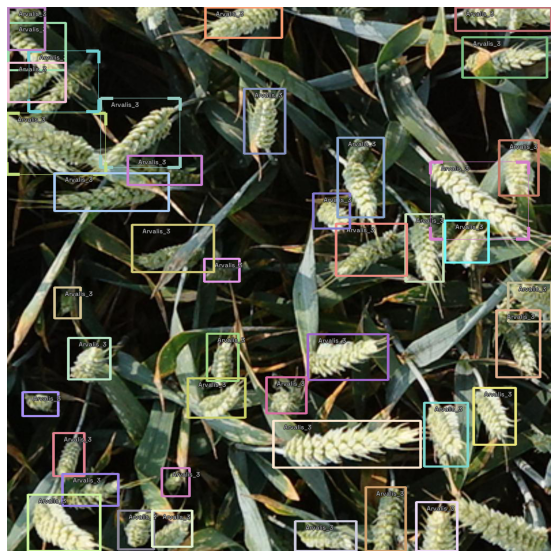

In [ ]:
show_record(train_records[0], #class_map=class_map, 
            figsize = (10,10))#,font_size=20, label_color = '#ffff00')

In [ ]:
train_records[0]

BaseRecord

common: 
	- Record ID: 2488
	- Filepath: /content/global-wheat-detection/train/16501f9a1.jpg
	- Img: None
	- Image size ImgSize(width=1024, height=1024)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'usask_1': 1, 'arvalis_1': 2, 'inrae_1': 3, 'ethz_1': 4, 'arvalis_3': 5, 'rres_1': 6, 'arvalis_2': 7}>
	- Labels: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
	- BBoxes: [<BBox (xmin:878.0, ymin:716.0, xmax:957.0, ymax:824.0)>, <BBox (xmin:446.0, ymin:153.0, xmax:523.0, ymax:276.0)>, <BBox (xmin:566.0, ymin:615.0, xmax:717.0, ymax:702.0)>, <BBox (xmin:373.0, ymin:0.0, xmax:517.0, ymax:58.0)>, <BBox (xmin:115.0, ymin:622.0, xmax:194.0, ymax:701.0)>, <BBox (xmin:785.0, ymin:744.0, xmax:867.0, ymax:865.0)>, <BBox (xmin:750.0, ymin:389.0, xmax:821.0, ymax:517.0)>, <BBox (xmin:619.0, ymin:407.0, xmax:752.0, ymax:506.0)>, <BBox (xmin:176.0, ymin:171.0, xmax:325.0, ymax:302.0)>, <BBox (xmin:0.0, 

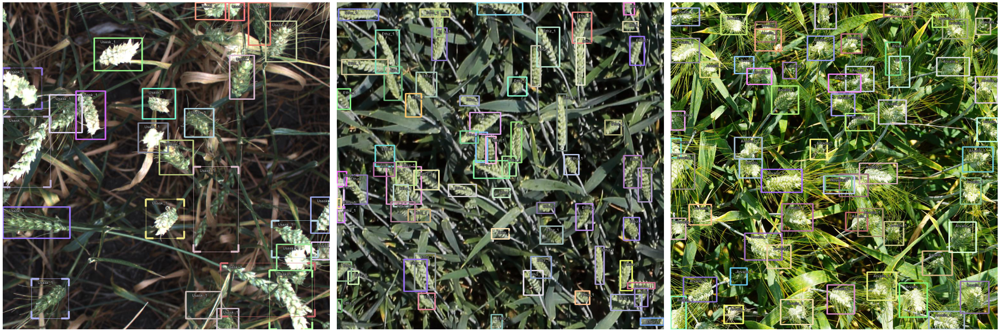

In [ ]:
show_records(train_records_csv[1:4], ncols=3)#,
            # font_size=60, label_color = '#ff5000')

In [ ]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [ ]:
train_ds = Dataset(train_records_csv, train_tfms)
valid_ds = Dataset(valid_records_csv, valid_tfms)

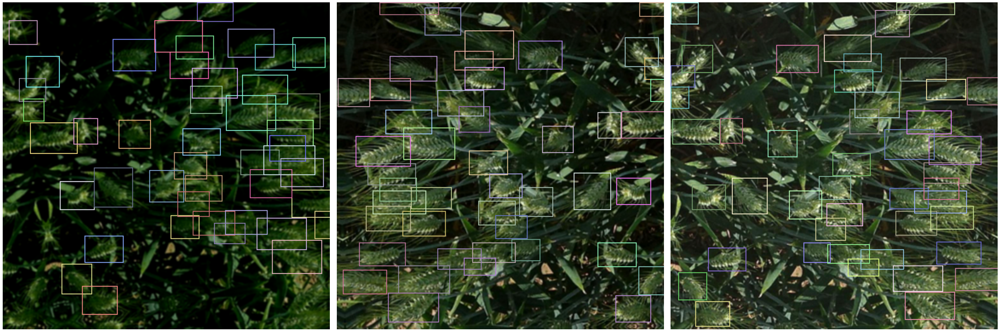

In [ ]:
samples = [train_ds[5] for _ in range(3)]
show_samples(samples, ncols=3, display_label=False)#, font_size=30, label_color = '#ffff00')

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=0.0002511886414140463, lr_steep=9.999999747378752e-06)

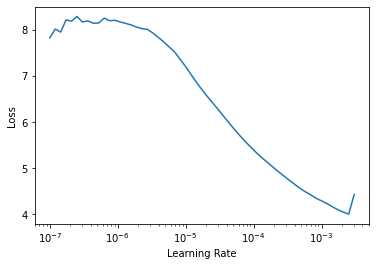

In [ ]:
model_type_frcnn = models.torchvision.faster_rcnn ##
model_frcnn = model_type_frcnn.model( ##
                      num_classes=len(parser.class_map))

train_dl_frcnn = model_type_frcnn.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_frcnn = model_type_frcnn.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)

learn_frcnn = model_type_frcnn.fastai.learner(dls=[train_dl_frcnn, ###
                                                   valid_dl_frcnn], #
                                              model=model_frcnn, metrics=metrics)#
learn_frcnn.lr_find()#

In [ ]:
learn_frcnn.fine_tune(10, 3e-4, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,6.383153,6.160336,0.043060,03:44


epoch,train_loss,valid_loss,COCOMetric,time
0,1.652543,1.492726,0.153535,05:12
1,1.370237,1.222760,0.270598,05:13
2,1.221234,1.144221,0.311303,05:19
3,1.131351,1.046504,0.366997,05:14
4,1.097364,1.018857,0.368998,05:17
5,1.051908,0.973361,0.406696,05:11
6,1.022984,0.948357,0.411292,05:17
7,1.008479,0.937891,0.415538,05:14
8,0.999017,0.936621,0.416790,05:12
9,0.995120,0.927409,0.421282,05:12


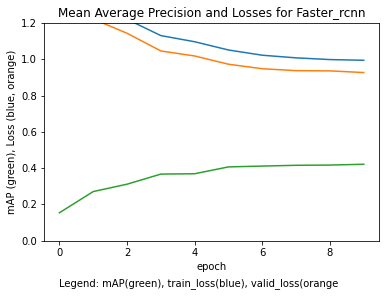

In [ ]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())#
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.25, 'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1.2);

plot_metrics(learn_frcnn, 'Mean Average Precision and Losses for Faster_rcnn')

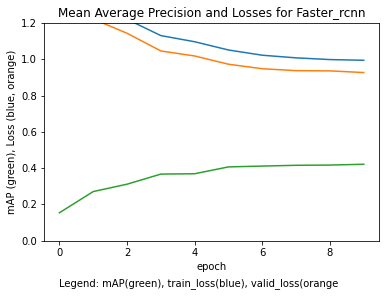

In [ ]:
plot_metrics(learn_frcnn, 'Mean Average Precision and Losses for Faster_rcnn')

  0%|          | 0.00/14.1M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=0.004786301031708717, lr_steep=0.002511886414140463)

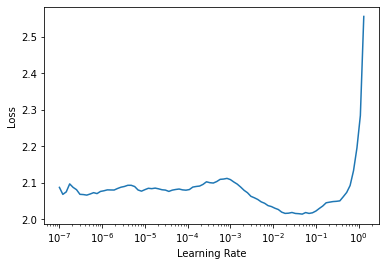

In [ ]:
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
learn_yolo.lr_find()#

In [ ]:
learn_yolo.fine_tune(10, 5e-3 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.974813,1.943789,0.018091,02:36


epoch,train_loss,valid_loss,COCOMetric,time
0,1.515311,1.433720,0.125250,02:29
1,1.345250,1.254847,0.212621,02:31
2,1.262228,1.163005,0.279098,02:29
3,1.212567,1.152735,0.275945,02:29
4,1.175381,1.101221,0.366821,02:30
5,1.155515,1.080502,0.376971,02:29
6,1.120248,1.054911,0.397859,02:28
7,1.098993,1.044839,0.408165,02:28
8,1.100189,1.039486,0.412741,02:29
9,1.090486,1.035325,0.416188,02:28


In [ ]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())#
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1);

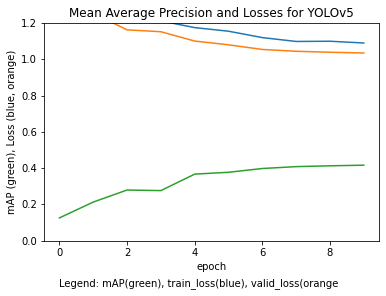

In [ ]:
plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5')

  0%|          | 0/152149505 [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/mmcv/cnn/utils/weight_init.py:119: UserWarning: init_cfg without layer key, if you do not define override key either, this init_cfg will do nothing
  'init_cfg without layer key, if you do not define override'


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([63, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([63]).


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=5.754399462603033e-05, lr_steep=0.00015848931798245758)

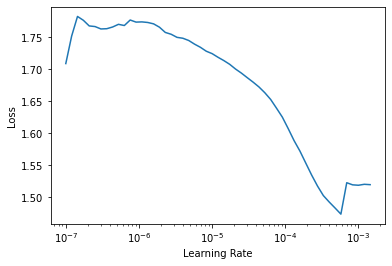

In [ ]:
model_type_ret = models.mmdet.retinanet #
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_ret = model_type_ret.model(backbone=backbone_r50(pretrained=True), #
                      num_classes=len(parser.class_map))

train_dl_ret = model_type_ret.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)#
valid_dl_ret = model_type_ret.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)#

learn_ret = model_type_ret.fastai.learner(dls=[train_dl_ret, valid_dl_ret], model=model_ret, metrics=metrics)#
learn_ret.lr_find()#

In [ ]:
learn_ret.fine_tune(10, 6e-5 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.991270,0.872818,0.044748,04:12


epoch,train_loss,valid_loss,COCOMetric,time
0,0.780052,0.764493,0.086428,04:19
1,0.710752,0.677195,0.159897,04:20
2,0.640178,0.605906,0.226988,04:27
3,0.601439,0.573004,0.279060,04:30
4,0.577706,0.551223,0.308527,04:30
5,0.560566,0.538762,0.320074,04:30
6,0.549138,0.532888,0.331619,04:30
7,0.540977,0.523615,0.343188,04:35
8,0.536264,0.517967,0.347531,04:32
9,0.536147,0.518350,0.347043,04:31


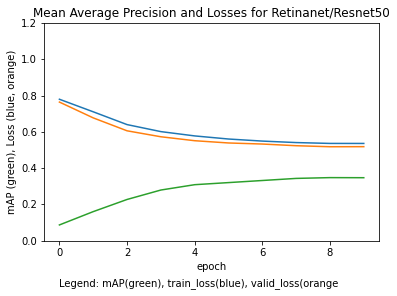

In [ ]:
 plot_metrics(learn_ret, 'Mean Average Precision and Losses for Retinanet/Resnet50')

Downloading: "https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_lite0-f5f303a9.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientdet_lite0-f5f303a9.pth
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


SuggestedLRs(lr_min=0.025118863582611083, lr_steep=0.007585775572806597)

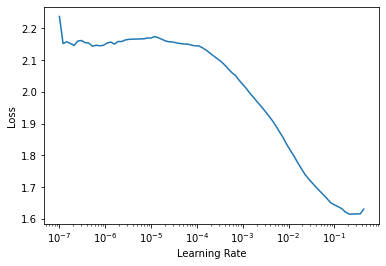

In [ ]:
model_type_eff = models.ross.efficientdet ##
backbone_eff = model_type_eff.backbones.tf_lite0#
model_eff = model_type_eff.model(backbone = backbone_eff(pretrained=True), ##
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_eff = model_type_eff.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_eff = model_type_eff.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_eff = model_type_eff.fastai.learner(dls=[train_dl_eff, ###
                                                   valid_dl_eff], #
                                              model=model_eff, metrics=metrics)#
learn_eff.lr_find()#

In [ ]:
learn_eff.fine_tune(10, 3e-2, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.139961,4.687546,0.004228,03:08


epoch,train_loss,valid_loss,COCOMetric,time
0,0.766616,0.747855,0.126493,03:36
1,0.678119,0.789531,0.188362,03:43
2,0.644723,0.652877,0.271332,03:48
3,0.610408,0.658595,0.303196,03:45
4,0.574041,0.558964,0.354510,03:50
5,0.556998,0.504282,0.392268,03:47
6,0.531289,0.497086,0.386341,03:48
7,0.513959,0.468332,0.415012,03:50
8,0.503245,0.463523,0.418116,03:55
9,0.491253,0.458929,0.424009,03:53


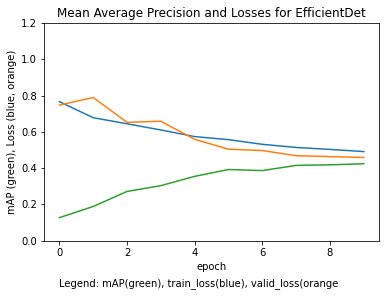

In [ ]:
plot_metrics(learn_eff, 'Mean Average Precision and Losses for EfficientDet')

SuggestedLRs(lr_min=2.7542287716642023e-05, lr_steep=2.2908675418875646e-06)

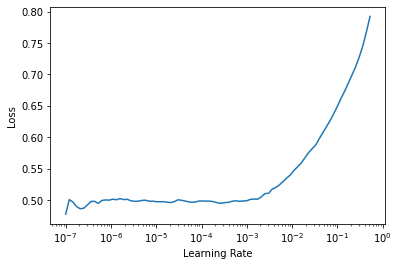

In [ ]:
## final model use efficientdet
# extend using differing lr's
learn_eff.lr_find()#

In [ ]:
from fastai.callback.tracker import SaveModelCallback
fname='wheat-eff-best'
learn_eff.unfreeze()
learn_eff.fit_one_cycle(10, 3e-5, cbs=SaveModelCallback(monitor='COCOMetric', fname=fname))
#learn.fine_tune(50, 1e-02, freeze_epochs=1, cbs=SaveModelCallback(monitor='COCOMetric', fname=fname))

epoch,train_loss,valid_loss,COCOMetric,time
0,0.494222,0.459462,0.423675,03:52
1,0.490922,0.460942,0.422222,03:51
2,0.495695,0.459017,0.421701,03:51
3,0.493457,0.458293,0.426344,03:53
4,0.486467,0.456360,0.426884,03:52
5,0.489650,0.454703,0.426919,03:51
6,0.483379,0.454316,0.427747,03:51
7,0.482559,0.454240,0.427979,03:52
8,0.485622,0.454456,0.428462,03:51
9,0.483140,0.453544,0.428556,03:50


Better model found at epoch 0 with COCOMetric value: 0.42367463130141675.
Better model found at epoch 3 with COCOMetric value: 0.42634387286609843.
Better model found at epoch 4 with COCOMetric value: 0.4268842065704373.
Better model found at epoch 5 with COCOMetric value: 0.4269190522529604.
Better model found at epoch 6 with COCOMetric value: 0.4277471663483344.
Better model found at epoch 7 with COCOMetric value: 0.4279788862226908.
Better model found at epoch 8 with COCOMetric value: 0.42846177827830706.
Better model found at epoch 9 with COCOMetric value: 0.42855568279702744.


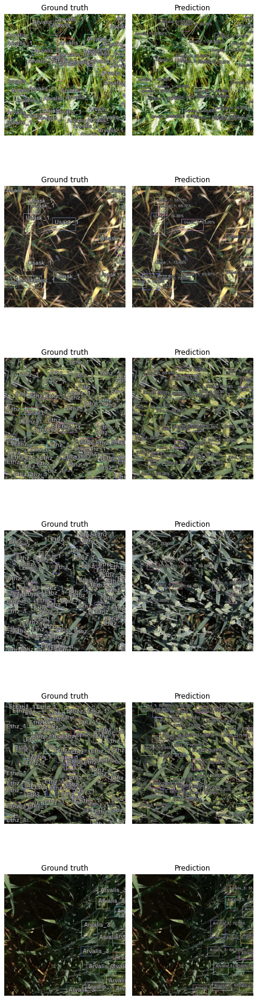

In [ ]:
model_type_eff.show_results(model_eff, valid_ds) # class_map rem

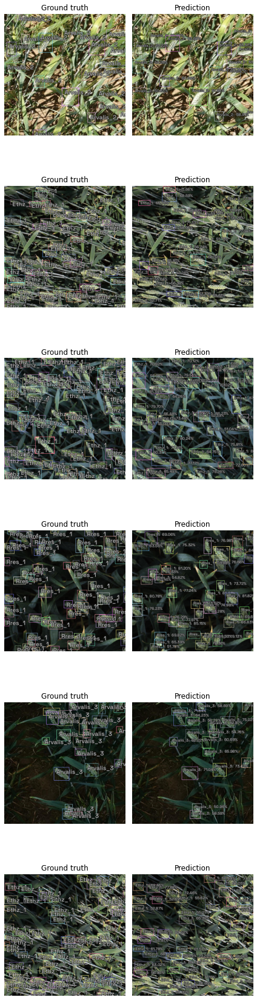

In [ ]:
model_type_eff.show_results(model_eff, valid_ds) # class_map rem

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

Mounted at /content/gdrive


In [ ]:
#best model
!ls models

wheat-eff-best.pth


In [ ]:
!cp models/wheat-eff-best.pth /content/gdrive/"My Drive"/models/wheat-eff-best.pth
#!cp models/bccd-faster-rcnn-best.pth /content/gdrive/"My Drive"/models/bccd-faster-rcnn-best.pth